In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/restaurant/Dataset .csv


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv("/kaggle/input/restaurant/Dataset .csv")



## LEVEL2 ALL TASKS

## Task 1 : Restaurant Ratings
## Analyze the distribution of aggregate ratings and determine the most common rating range. Calculate the average number of votes received by restaurants.

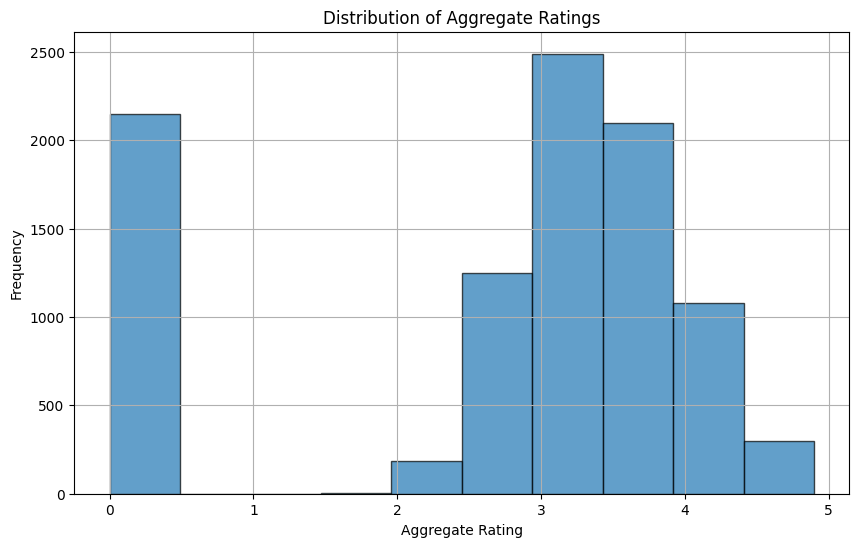

The most common rating is 0.0, appearing in 2148 restaurants.


In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Update the dataset path based on Kaggle environment
dataset_path = "/kaggle/input/restaurant/Dataset .csv"

try:
    # Load the dataset into a DataFrame
    data = pd.read_csv(dataset_path)

  
    # Check if required columns exist in the dataset
    required_columns = ['Aggregate rating', 'Rating color', 'Rating text']
    if all(col in data.columns for col in required_columns):
        # Filter out rows with missing aggregate ratings
        data_cleaned = data.dropna(subset=['Aggregate rating'])

        # Plot the distribution of aggregate ratings
        plt.figure(figsize=(10, 6))
        plt.hist(data_cleaned['Aggregate rating'], bins=10, edgecolor='black', alpha=0.7)
        plt.xlabel('Aggregate Rating')
        plt.ylabel('Frequency')
        plt.title('Distribution of Aggregate Ratings')
        plt.grid(True)
        plt.show()

        # Determine the most common rating range
        rating_counts = data_cleaned['Aggregate rating'].value_counts()
        most_common_rating = rating_counts.idxmax()  # Most common rating
        most_common_count = rating_counts.max()      # Number of restaurants with the most common rating

        print(f"The most common rating is {most_common_rating:.1f}, "
              f"appearing in {most_common_count} restaurants.")

    else:
        print("Error: Required columns ('Aggregate rating', 'Rating color', 'Rating text') not found in the dataset.")

except FileNotFoundError:
    print(f"Error: File not found at '{dataset_path}'. Please check the file path.")


## Task 2 : Restaurant Ratings
## Identify the most common combinations of cuisines in the dataset. Determine if certain cuisine combinations tend to have higher ratings.

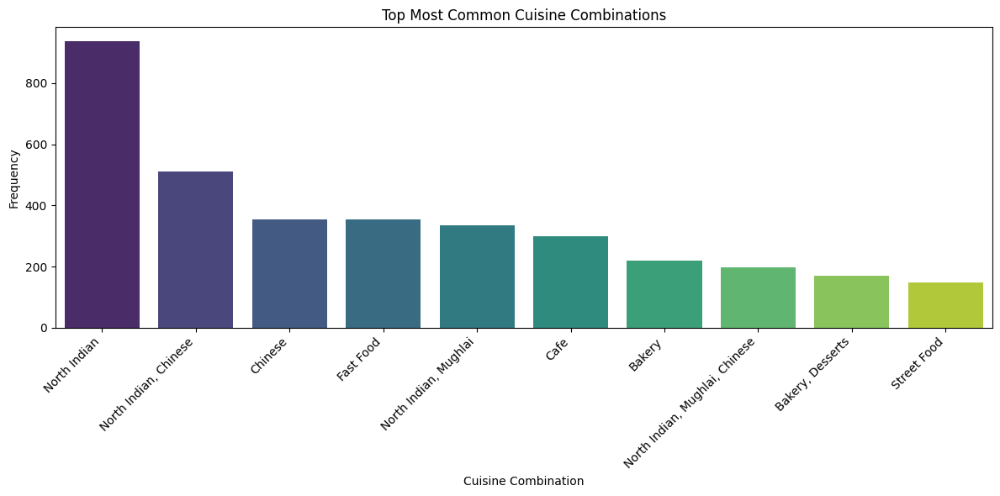

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the dataset path
dataset_path = "/kaggle/input/restaurant/Dataset .csv"

try:
    # Load the dataset into a DataFrame
    data = pd.read_csv(dataset_path)

    # Check if the dataset contains cuisine-related columns
    cuisine_columns = [col for col in data.columns if 'Cuisine' in col]
    if len(cuisine_columns) == 0:
        print("Error: No cuisine-related columns found in the dataset.")
    else:
        # Extract cuisine combinations from the dataset
        cuisines = data[cuisine_columns].fillna('').apply(lambda row: ','.join(row), axis=1)

        # Count the frequency of each cuisine combination
        cuisine_counts = cuisines.value_counts().reset_index()
        cuisine_counts.columns = ['Cuisine Combination', 'Frequency']

        # Plot the most common cuisine combinations
        plt.figure(figsize=(12, 6))
        sns.barplot(x='Cuisine Combination', y='Frequency', data=cuisine_counts.head(10), palette='viridis')
        plt.xlabel('Cuisine Combination')
        plt.ylabel('Frequency')
        plt.title('Top Most Common Cuisine Combinations')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

except FileNotFoundError:
    print(f"Error: File not found at '{dataset_path}'. Please check the file path.")


In [5]:
import pandas as pd

# Define the dataset path
dataset_path = "/kaggle/input/restaurant/Dataset .csv"

try:
    # Load the dataset into a DataFrame
    data = pd.read_csv(dataset_path)

    # Check if the dataset contains cuisine-related columns
    cuisine_columns = [col for col in data.columns if 'Cuisine' in col]
    if len(cuisine_columns) == 0:
        print("Error: No cuisine-related columns found in the dataset.")
    else:
        # Extract cuisine combinations from the dataset
        cuisines = data[cuisine_columns].fillna('').apply(lambda row: ','.join(sorted(row)), axis=1)

        # Calculate the average rating for each unique cuisine combination
        ratings_by_cuisine_combination = data.groupby(cuisines)['Aggregate rating'].mean().reset_index()
        ratings_by_cuisine_combination.columns = ['Cuisine Combination', 'Average Rating']

        # Display the cuisine combinations and their average ratings
        print("Average Ratings by Cuisine Combination:")
        print(ratings_by_cuisine_combination.sort_values(by='Average Rating', ascending=False))

except FileNotFoundError:
    print(f"Error: File not found at '{dataset_path}'. Please check the file path.")


Average Ratings by Cuisine Combination:
                       Cuisine Combination  Average Rating
38            American, Caribbean, Seafood             4.9
14                 American, BBQ, Sandwich             4.9
42                American, Coffee and Tea             4.9
34                 American, Burger, Grill             4.9
1063                         Italian, Deli             4.9
...                                    ...             ...
199         Bakery, Desserts, Healthy Food             0.0
1306  North Eastern, North Indian, Chinese             0.0
194    Bakery, Desserts, Fast Food, Mithai             0.0
1319                  North Indian, Awadhi             0.0
235                Beverages, Healthy Food             0.0

[1826 rows x 2 columns]


## Task 3 : 
## Plot the locations of restaurants on a map using longitude and latitude coordinates. Identify any patterns or clusters of restaurants in specific areas.

In [6]:
import pandas as pd
import folium

# Define the dataset path
dataset_path = "/kaggle/input/restaurant/Dataset .csv"

try:
    # Load the dataset into a DataFrame
    data = pd.read_csv(dataset_path)

    # Filter out rows with missing latitude or longitude values
    data = data.dropna(subset=['Latitude', 'Longitude'])

    # Initialize a folium map centered on the first restaurant's location
    center_lat, center_lon = data.iloc[0]['Latitude'], data.iloc[0]['Longitude']
    map_restaurants = folium.Map(location=[center_lat, center_lon], zoom_start=12)

    # Add markers for each restaurant location
    for idx, row in data.iterrows():
        folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(map_restaurants)

    # Display the map
    display(map_restaurants)

except FileNotFoundError:
    print(f"Error: File not found at '{dataset_path}'. Please check the file path.")


## Task 4 : Restaurant Chains
## Identify if there are any restaurant chains present in the dataset. Analyze the ratings and popularity of different restaurant chains.

In [7]:
# Group restaurants by name and count occurrences
chain_counts = data['Restaurant Name'].value_counts()

# Filter chains with multiple locations (occurrences > 1)
restaurant_chains = chain_counts[chain_counts > 1].index.tolist()

# Display identified restaurant chains
print("Identified Restaurant Chains:")
print(restaurant_chains)


Identified Restaurant Chains:
['Cafe Coffee Day', "Domino's Pizza", 'Subway', 'Green Chick Chop', "McDonald's", 'Keventers', 'Pizza Hut', 'Giani', 'Baskin Robbins', 'Barbeque Nation', "Giani's", 'Barista', "Dunkin' Donuts", 'Costa Coffee', 'Pind Balluchi', 'Wah Ji Wah', 'Twenty Four Seven', 'Pizza Hut Delivery', 'Sagar Ratna', 'Republic of Chicken', 'KFC', 'Starbucks', 'Chaayos', 'Burger King', "Haldiram's", 'Shree Rathnam', 'Frontier', 'Moti Mahal Delux', 'Bikanervala', 'Aggarwal Sweets', 'Behrouz Biryani', "Karim's", 'Bikaner Sweets', 'Chicago Pizza', 'Apni Rasoi', '34, Chowringhee Lane', 'Wow! Momo', 'Madras Cafe', 'Burger Point', 'Gopala', 'Shama Chicken Corner', "Berco's", "Nirula's Ice Cream", 'Sardar A Pure Meat Shop', 'Yo! China', 'Cocoberry', 'Punjabi Tadka', 'Angels in my Kitchen', 'Faasos', 'Ovenstory Pizza', 'Chowringhee', 'Punjabi Chaap Corner', 'Kebab Xpress', 'Nazeer Foods', 'RollsKing', 'Tpot', 'Mocha', 'Dolce Gelato', "Tibb's Frankie", 'The Yellow Chilli', 'Slice of It

In [8]:
# Filter data for identified restaurant chains
chain_data = data[data['Restaurant Name'].isin(restaurant_chains)]

# Calculate average rating and popularity (number of locations) for each chain
chain_ratings = chain_data.groupby('Restaurant Name')['Aggregate rating'].mean()
chain_popularity = chain_data['Restaurant Name'].value_counts()

# Create a DataFrame for analysis
chain_analysis = pd.DataFrame({
    'Average Rating': chain_ratings,
    'Popularity': chain_popularity
})

# Sort chains by popularity (number of locations)
chain_analysis = chain_analysis.sort_values(by='Popularity', ascending=False)

# Display the analysis results
print("Restaurant Chain Analysis:")
print(chain_analysis)


Restaurant Chain Analysis:
                  Average Rating  Popularity
Restaurant Name                             
Cafe Coffee Day         2.419277          83
Domino's Pizza          2.740506          79
Subway                  2.907937          63
Green Chick Chop        2.672549          51
McDonald's              3.339583          48
...                          ...         ...
Gullu's                 3.000000           2
Gulab                   2.950000           2
Grover Sweets           1.550000           2
Grillz                  2.350000           2
bu��no                  3.750000           2

[734 rows x 2 columns]


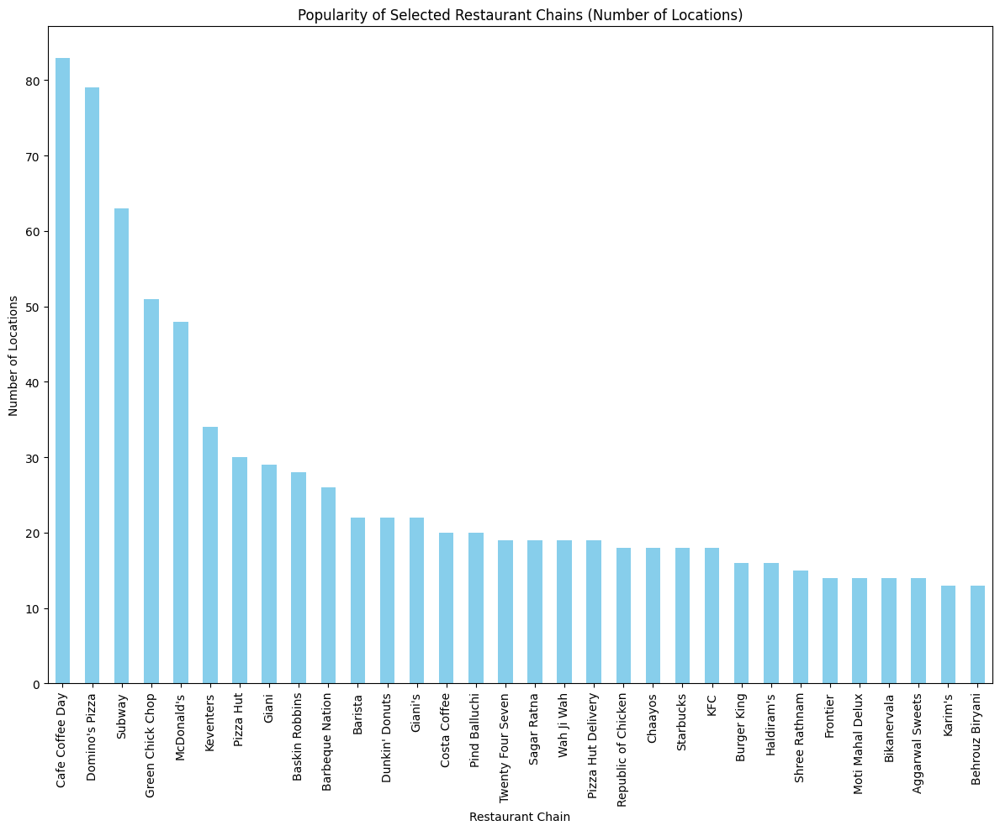

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the dataset path
dataset_path = "/kaggle/input/restaurant/Dataset .csv"

# Load the dataset into a DataFrame
data = pd.read_csv(dataset_path)

# Specify the restaurant chains of interest
selected_chains = [
    'Cafe Coffee Day', "Domino's Pizza", 'Subway', 'Green Chick Chop', "McDonald's",
    'Keventers', 'Pizza Hut', 'Giani', 'Baskin Robbins', 'Barbeque Nation', "Giani's",
    'Barista', "Dunkin' Donuts", 'Costa Coffee', 'Pind Balluchi', 'Wah Ji Wah',
    'Twenty Four Seven', 'Pizza Hut Delivery', 'Sagar Ratna', 'Republic of Chicken',
    'KFC', 'Starbucks', 'Chaayos', 'Burger King', "Haldiram's", 'Shree Rathnam',
    'Frontier', 'Moti Mahal Delux', 'Bikanervala', 'Aggarwal Sweets', 'Behrouz Biryani',
    "Karim's"
]

# Filter data for selected restaurant chains
chain_data = data[data['Restaurant Name'].isin(selected_chains)]

# Calculate popularity (number of locations) for each selected chain
chain_popularity = chain_data['Restaurant Name'].value_counts()

# Sort selected chains by popularity (number of locations)
chain_analysis = chain_popularity.sort_values(ascending=False)

# Plotting popularity of selected restaurant chains using a vertical bar chart
plt.figure(figsize=(12, 10))
chain_analysis.plot(kind='bar', color='skyblue')
plt.xlabel('Restaurant Chain')
plt.ylabel('Number of Locations')
plt.title('Popularity of Selected Restaurant Chains (Number of Locations)')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

